<a href="https://colab.research.google.com/github/Pmilivojevic/Colorization/blob/master/CGAN_colorization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import tensorflow as tf
from tensorflow.keras import backend as K
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import Conv2D, Activation, Dropout, Add, Concatenate, Input, UpSampling2D, Flatten, BatchNormalization

import os
import sys
import time
import datetime
import random

from matplotlib import pyplot as plt
from IPython import display
import cv2
import numpy as np
from google.colab import drive
drive.mount('/content/drive/')

log_dir="logs/"
summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

Mounted at /content/drive/


In [ ]:
data_path= '/content/drive/My Drive/Colab Notebooks/train/dir_4'
generator_path= '/content/drive/MyDrive/Colab Notebooks/models/CGAN/Generator/'
discriminator_path= '/content/drive/MyDrive/Colab Notebooks/models/CGAN/Discriminator/'
BUFFER_SIZE = 400
BATCH_SIZE = 1
IMG_SIZE = 256
OUTPUT_CHANNELS = 2
LAMBDA1= 1
LAMBDA2 = 100
EPOCHS = 20

In [ ]:
train_input= []
train_real= []

for i in range(len(os.listdir(data_path))):
  if i < len(os.listdir(data_path)) - len(os.listdir(data_path))//8:
    image= cv2.imread(os.path.join(data_path, os.listdir(data_path)[i]))
    imgLAB= cv2.cvtColor(image, cv2.COLOR_BGR2LAB)

    h, w, c= imgLAB.shape
    if w > 312 and h > 312:
      if w > h:
        img= imgLAB[:,np.int((w-h)/2):np.int((w-h)/2+h),:]
      elif h > w:
        img= imgLAB[np.int((h-w)/2):np.int((h-w)/2+h),:,:]
      else:
        img= imgLAB
      img= cv2.resize(img, (256, 256), cv2.INTER_AREA)

      real_image= cv2.merge((img[:,:,1], img[:,:,2]))
      input_image= img[:,:,0]

      #input_image = tf.cast(input_image, tf.float32)
      #real_image = tf.cast(real_image, tf.float32)

      input_image = input_image / 256
      real_image = real_image / 256

      train_input.append(input_image)
      train_real.append(real_image)

train_input= np.array(train_input).reshape(-1, 256, 256, 1)
train_real= np.array(train_real).reshape(-1, 256, 256, 2)
train_input= train_input.astype('float32')
train_real= train_real.astype('float32')

In [ ]:
test_input= []
test_real= []

for i in range((len(os.listdir(data_path)) - len(os.listdir(data_path))//8), len(os.listdir(data_path))):
  image= cv2.imread(os.path.join(data_path, os.listdir(data_path)[i]))
  imgLAB= cv2.cvtColor(image, cv2.COLOR_BGR2LAB)

  h, w, c= imgLAB.shape
  if w > 312 and h > 312:
    if w > h:
      img= imgLAB[:,np.int((w-h)/2):np.int((w-h)/2+h),:]
    elif h > w:
      img= imgLAB[np.int((h-w)/2):np.int((h-w)/2+h),:,:]
    else:
      img= imgLAB
    img= cv2.resize(img, (256, 256), cv2.INTER_AREA)

    real_image= cv2.merge((img[:,:,1], img[:,:,2]))
    input_image= img[:,:,0]

    #input_image = tf.cast(input_image, tf.float32)
    #real_image = tf.cast(real_image, tf.float32)

    input_image = input_image / 256
    real_image = real_image / 256

    test_input.append(input_image)
    test_real.append(real_image)

test_input= np.array(test_input).reshape(-1, 256, 256, 1)
test_real= np.array(test_real).reshape(-1, 256, 256, 2)
test_input= test_input.astype('float32')
test_real= test_real.astype('float32')

In [ ]:
print(train_input.shape)
print(test_input.shape)

(3498, 256, 256, 1)
(500, 256, 256, 1)


In [ ]:
'''generate_images(generator, train_input[546][tf.newaxis,...], train_real[546][tf.newaxis,...])
num= random.randint(100, 999)
print (num)
random.seed(num)
random.shuffle(train_input)
random.seed(num)
random.shuffle(train_real)
generate_images(generator, train_input[546][tf.newaxis,...], train_real[546][tf.newaxis,...])'''

'generate_images(generator, train_input[546][tf.newaxis,...], train_real[546][tf.newaxis,...])\nnum= random.randint(100, 999)\nprint (num)\nrandom.seed(num)\nrandom.shuffle(train_input)\nrandom.seed(num)\nrandom.shuffle(train_real)\ngenerate_images(generator, train_input[546][tf.newaxis,...], train_real[546][tf.newaxis,...])'

In [ ]:
def bn_act(x, act=True):
    x = BatchNormalization()(x)
    if act == True:
        x = Activation("relu")(x)
    return x

def conv_block(x, filters, kernel_size=(3,3), padding="same", strides=1):
    conv = bn_act(x)
    conv = Conv2D(filters, kernel_size, padding=padding, strides=strides)(conv)
    return conv

def stem(x, filters, kernel_size=(3,3), padding="same", strides=1):
    conv = Conv2D(filters, kernel_size, padding=padding, strides=strides)(x)
    conv = conv_block(conv, filters, kernel_size=kernel_size, padding=padding, strides=strides)

    shortcut = Conv2D(filters, kernel_size=(1, 1), padding=padding, strides=strides)(x)
    shortcut = bn_act(shortcut, act=False)

    output = Add()([conv, shortcut])
    return output

def residual_block(x, filters, kernel_size=(3,3), padding="same", strides=1):
    res = conv_block(x, filters, kernel_size=kernel_size, padding=padding, strides=strides)
    res = conv_block(res, filters, kernel_size=kernel_size, padding=padding, strides=1)

    shortcut = Conv2D(filters, kernel_size=(1, 1), padding=padding, strides=strides)(x)
    shortcut = bn_act(shortcut, act=False)

    output = Add()([shortcut, res])
    return output

def upsample_concat_block(x, xskip, ks):
    u = UpSampling2D((ks, ks))(x)
    c = Concatenate()([u, xskip])
    return c

In [ ]:
def Generator():
  f = [16, 32, 64, 256, 512]
  inputs = Input((IMG_SIZE, IMG_SIZE, 1))

  ## Encoder
  e0 = conv_block(inputs, filters=1, kernel_size=(5,5), padding='same', strides=4)
  e1 = stem(e0, f[0])
  e2 = residual_block(e1, f[1], strides=2)
  e3 = residual_block(e2, f[2], strides=2)
  e4 = residual_block(e3, f[3], strides=2)
  e5 = residual_block(e4, f[4], strides=2)

  ## Bridge
  b0 = conv_block(e5, f[4], strides=1)
  b1 = conv_block(b0, f[4], strides=1)

  ## Decoder
  u1 = upsample_concat_block(b1, e4, 2)
  d1 = residual_block(u1, f[4])

  u2 = upsample_concat_block(d1, e3, 2)
  d2 = residual_block(u2, f[3])

  u3 = upsample_concat_block(d2, e2, 2)
  d3 = residual_block(u3, f[2])

  u4 = upsample_concat_block(d3, e1, 2)
  d4 = residual_block(u4, f[1])

  outputs = Conv2D(2, (1, 1), padding="same", activation="sigmoid")(d4)
  outputs= UpSampling2D((4, 4))(outputs)
  model = Model(inputs, outputs)
  return model

In [ ]:
def Discriminator():
  f = [16, 32, 64, 256, 512]
  inp = tf.keras.layers.Input(shape=[256, 256, 1], name='input_image')
  tar = tf.keras.layers.Input(shape=[256, 256, 2], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar])
  #inputs = Input((IMG_SIZE, IMG_SIZE, 3))
  e0 = conv_block(x, filters=f[0], kernel_size=(3,3), padding='same', strides=1)
  e1 = stem(e0, f[1])
  e2 = residual_block(e1, f[2], strides=2)
  e3 = residual_block(e2, f[3], strides=2)
  e4 = residual_block(e3, f[4], strides=2)
  flatten= tf.keras.layers.Flatten(name= 'flatten')(e4)
  lastDense= tf.keras.layers.Dense(1, activation= 'sigmoid')(flatten)

  return tf.keras.Model(inputs=[inp, tar], outputs= lastDense)

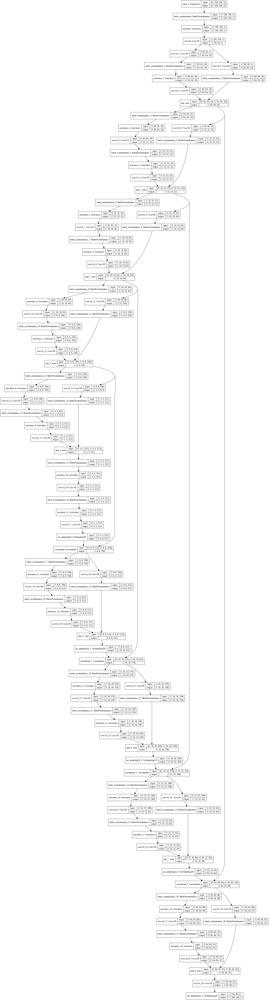

In [ ]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

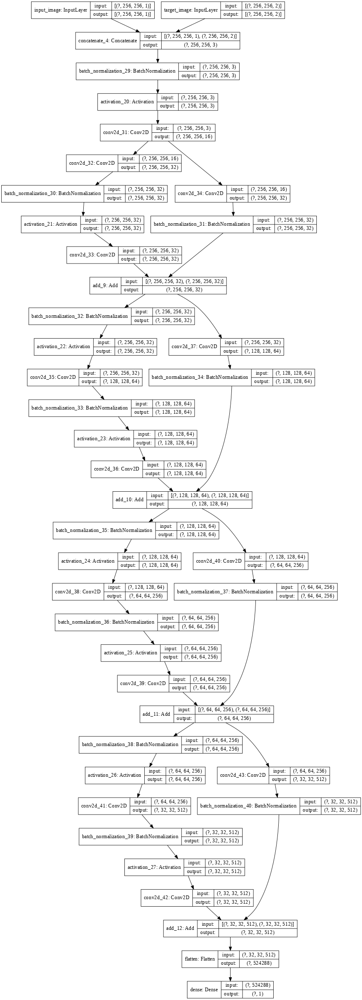

In [ ]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi= 64)

In [ ]:
'''def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 1], name='input_image')
  tar = tf.keras.layers.Input(shape=[256, 256, 2], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar]) # (bs, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x) # (bs, 128, 128, 64)
  down2 = downsample(128, 4)(down1) # (bs, 64, 64, 128)
  down3 = downsample(256, 4)(down2) # (bs, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1) # (bs, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1, kernel_initializer=initializer)(zero_pad2) # (bs, 30, 30, 1)
  flatten= tf.keras.layers.Flatten(name= 'flatten')(last)
  lastDense= tf.keras.layers.Dense(1, activation= 'sigmoid')(flatten)

  return tf.keras.Model(inputs=[inp, tar], outputs= lastDense)'''

"def Discriminator():\n  initializer = tf.random_normal_initializer(0., 0.02)\n\n  inp = tf.keras.layers.Input(shape=[256, 256, 1], name='input_image')\n  tar = tf.keras.layers.Input(shape=[256, 256, 2], name='target_image')\n\n  x = tf.keras.layers.concatenate([inp, tar]) # (bs, 256, 256, channels*2)\n\n  down1 = downsample(64, 4, False)(x) # (bs, 128, 128, 64)\n  down2 = downsample(128, 4)(down1) # (bs, 64, 64, 128)\n  down3 = downsample(256, 4)(down2) # (bs, 32, 32, 256)\n\n  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3) # (bs, 34, 34, 256)\n  conv = tf.keras.layers.Conv2D(512, 4, strides=1,\n                                kernel_initializer=initializer,\n                                use_bias=False)(zero_pad1) # (bs, 31, 31, 512)\n\n  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)\n\n  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)\n\n  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu) # (bs, 33, 33, 512)\n\n  last = tf.keras.layers.Conv2D(1, 4, strides

In [ ]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=False, label_smoothing=0, reduction="auto", name="binary_crossentropy")

In [ ]:
def generator_loss(disc_generated_output, gen_output, target):
  #gan_loss = loss_object((tf.zeros_like(disc_generated_output)+0.0005 * tf.random.uniform(disc_generated_output.shape)), disc_generated_output)

  gan_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  # mean absolute error
  mse= tf.keras.losses.MeanSquaredError()
  l1_loss= mse(target, gen_output)
  #l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = LAMBDA1*gan_loss + LAMBDA2 * l1_loss

  return total_gen_loss, gan_loss, l1_loss

![Generator Update Image](https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/images/gen.png?raw=1)


In [ ]:
def discriminator_loss(disc_real_output, disc_generated_output):
  #real_loss = loss_object((tf.ones_like(disc_real_output)-0.05 * tf.random.uniform(disc_real_output.shape)), disc_real_output)

  #generated_loss = loss_object((tf.zeros_like(disc_generated_output)+0.05 * tf.random.uniform(disc_generated_output.shape)), disc_generated_output)

  real_loss = loss_object((tf.zeros_like(disc_generated_output)+0.0005 * tf.random.uniform(disc_real_output.shape)), disc_real_output)

  generated_loss = loss_object((tf.ones_like(disc_real_output)-0.0005 * tf.random.uniform(disc_generated_output.shape)), disc_generated_output)

  #real_loss = loss_object(tf.zeros_like(disc_generated_output), disc_real_output)

  #generated_loss = loss_object(tf.ones_like(disc_real_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss, real_loss, generated_loss

![Discriminator Update Image](https://github.com/tensorflow/docs/blob/master/site/en/tutorials/generative/images/dis.png?raw=1)


In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(2e-6, beta_1=0.001)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-5, beta_1=0.001)

In [ ]:
def generate_images(model, test_input, test_real):
  prediction = model(test_input, training=True)
  #pred= cv2.cvtColor(cv2.merge((np.uint8((test_input[0,:,:,0]+1)*127.5), np.uint8((prediction[0,:,:,0]+1)*127.5), np.uint8((prediction[0,:,:,1]+1)*127.5))), cv2.COLOR_LAB2RGB)
  #real= cv2.cvtColor(cv2.merge((np.uint8((test_input[0,:,:,0]+1)*127.5), np.uint8((test_real[0,:,:,0]+1)*127.5), np.uint8((test_real[0,:,:,1]+1)*127.5))), cv2.COLOR_LAB2RGB)
  pred= cv2.cvtColor(cv2.merge((np.uint8((test_input[0])*256), np.uint8((prediction[0,:,:,0])*256), np.uint8((prediction[0,:,:,1])*256))), cv2.COLOR_LAB2RGB)
  real= cv2.cvtColor(cv2.merge((np.uint8(test_input[0]*256), np.uint8(test_real[0,:,:,0]*256), np.uint8(test_real[0,:,:,1]*256))), cv2.COLOR_LAB2RGB)

  #score= r2_score(test_real, prediction)
  #score= np.float32(score)
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  #print(np.float32(score))
  f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize= (12, 4))
  f.tight_layout()
  ax1.imshow(test_input[0,:,:,0], cmap= 'gray')
  ax2.imshow(real)
  ax3.imshow(pred)
  plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
  #return score

In [ ]:
def r2_score(y_true, y_pred):
    y_t= K.constant(y_true)
    y_p= K.constant(y_pred)
    SS_res =  K.sum(K.square( y_t-y_p ))
    SS_tot = K.sum(K.square( y_t - K.mean(y_t)))
#    SS_res =  K.sum(K.square( y_true-y_pred ))
 #   SS_tot = K.sum(K.square( y_true - K.mean(y_true)))
    return np.float32(1 - SS_res/(SS_tot + K.epsilon()))

In [ ]:
generator_load_path= generator_path + str(len(os.listdir(generator_path))) + '.h5'
generator= load_model(generator_load_path)
discriminator_load_path= discriminator_path + str(len(os.listdir(discriminator_path))) + '.h5'
discriminator= load_model(discriminator_load_path)

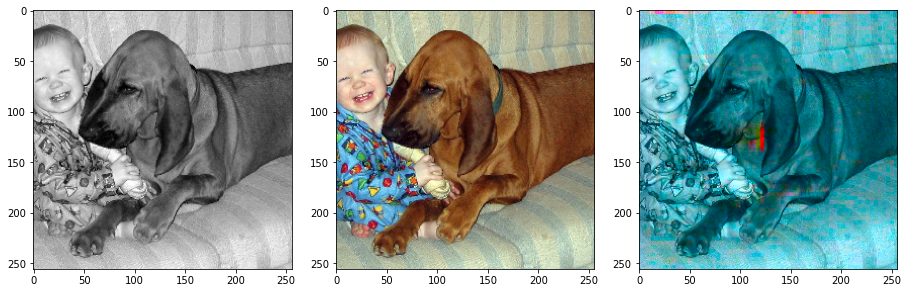

In [ ]:
generate_images(generator, test_input[3][tf.newaxis,...], test_real[3][tf.newaxis,...])

In [ ]:
@tf.function
def train_step(input_image, target, epoch):
  with tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)
    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)
    disc_loss, real_loss, gen_loss= discriminator_loss(disc_real_output, disc_generated_output)

  discriminator_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients, discriminator.trainable_variables))

  with tf.GradientTape() as gen_tape:
    gen_output = generator(input_image, training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)
    gen_total_loss, gan_loss, l1_loss= generator_loss(disc_generated_output, gen_output, target)

  generator_gradients = gen_tape.gradient(gen_total_loss, generator.trainable_variables)
  generator_optimizer.apply_gradients(zip(generator_gradients, generator.trainable_variables))

  return gen_output, gen_total_loss, gan_loss, l1_loss, disc_loss, real_loss, gen_loss

In [ ]:
def fit(train_input, train_real, epochs, test_input, test_real):
  for epoch in range(epochs):
    start = time.time()

    num= random.randint(100, 999)
    random.seed(num)
    random.shuffle(train_input)
    random.seed(num)
    random.shuffle(train_real)

    generate_images(generator, test_input[epoch][tf.newaxis,...], test_real[epoch][tf.newaxis,...])
    print(epoch+1,"/",epochs)

    # Train
    s= '['
    for i in range(len(train_real)):
      samp= str(i)+'/'+str(len(train_real))
      gen_img, loss, gan_loss, l1, dl, real_loss, gen_loss= train_step(train_input[i][tf.newaxis,...], train_real[i][tf.newaxis,...], epoch)

      score= r2_score(train_real[i], gen_img)

      g_val_loss= 0
      d_val_loss= 0
      val_score= 0

      if i % (len(train_real)//25) == 0:
        s= s+'='

      if i == (len(train_real)-1):
        for j in range(len(test_real)):
          val_gen_output= generator(test_input[j][tf.newaxis,...], training= False)
          val_disc_real_output = discriminator([test_input[j][tf.newaxis,...], test_real[j][tf.newaxis,...]], training= False)
          val_disc_generated_output = discriminator([test_input[j][tf.newaxis,...], val_gen_output], training= False)

          vgl, _, _= generator_loss(val_disc_generated_output, val_gen_output, test_real[j])
          vdl, _, _= discriminator_loss(val_disc_real_output, val_disc_generated_output)
          g_val_loss+= vgl
          d_val_loss+= vdl
          val_score+= r2_score(test_real[j], val_gen_output)

        g_val_loss= g_val_loss/len(test_real)
        d_val_loss= d_val_loss/len(test_real)
        val_score= val_score/len(test_real)


      sys.stdout.write('\r%s %s] - g_loss:%.4f - gan_loss:%.4f - l1_loss:%.4f - d_loss:%.4f - real_loss:%.4f - gen_loss:%.4f - score:%.4f - val_g_loss:%.4f - val_d_loss:%.4f - val_score:%.4f' %(samp.ljust(9), s.ljust(27), loss, gan_loss, l1, dl, real_loss, gen_loss, score, g_val_loss, d_val_loss, val_score))
      sys.stdout.flush()

    print()
    s= '['
  print()

  print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1, time.time()-start))

1 / 20
3497/3498 [==========================] - g_loss:37.3945 - gan_loss:32.3174 - l1_loss:0.0508 - d_loss:0.0970 - real_loss:0.0867 - gen_loss:0.0104 - score:-1.8610 - val_g_loss:3.8121 - val_d_loss:24.0172 - val_score:-115676494.0901
2 / 20
3497/3498 [==========================] - g_loss:54.9801 - gan_loss:53.8981 - l1_loss:0.0108 - d_loss:0.1471 - real_loss:0.1343 - gen_loss:0.0128 - score:-34.4355 - val_g_loss:17.6327 - val_d_loss:15.2412 - val_score:-140396439.3124
3 / 20
3497/3498 [==========================] - g_loss:13.8718 - gan_loss:12.3853 - l1_loss:0.0149 - d_loss:0.0757 - real_loss:0.0706 - gen_loss:0.0051 - score:-14.6333 - val_g_loss:4.2456 - val_d_loss:16.5800 - val_score:-143459218.2343
4 / 20
3497/3498 [==========================] - g_loss:81.7298 - gan_loss:78.2248 - l1_loss:0.0351 - d_loss:0.1516 - real_loss:0.1471 - gen_loss:0.0045 - score:-1.9343 - val_g_loss:2.4075 - val_d_loss:19.5569 - val_score:-147339491.3518
5 / 20
3497/3498 [==========================] - g

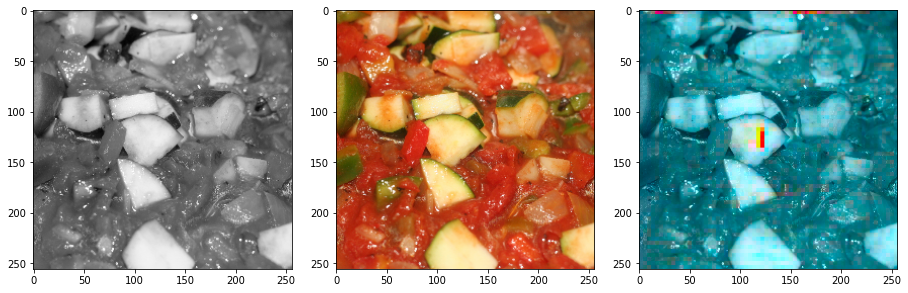

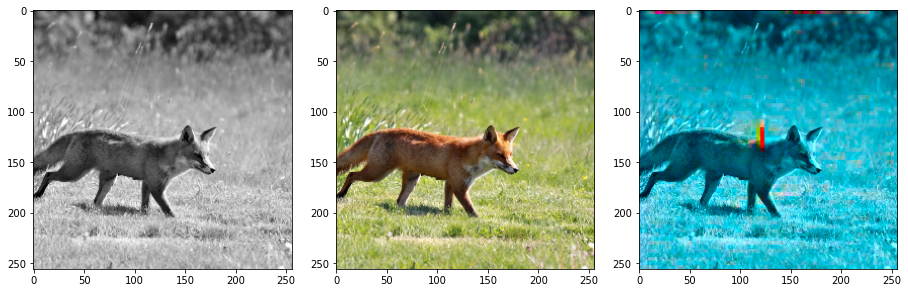

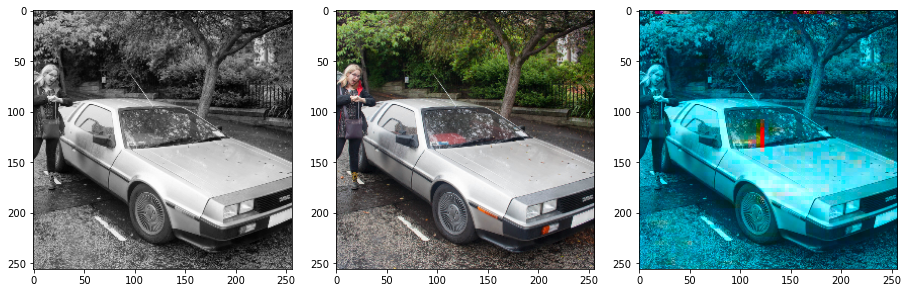

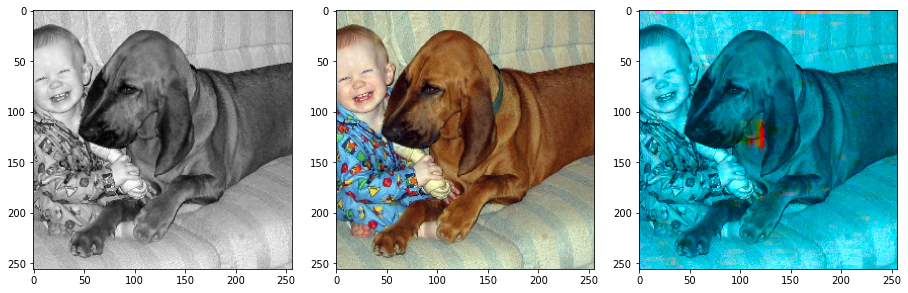

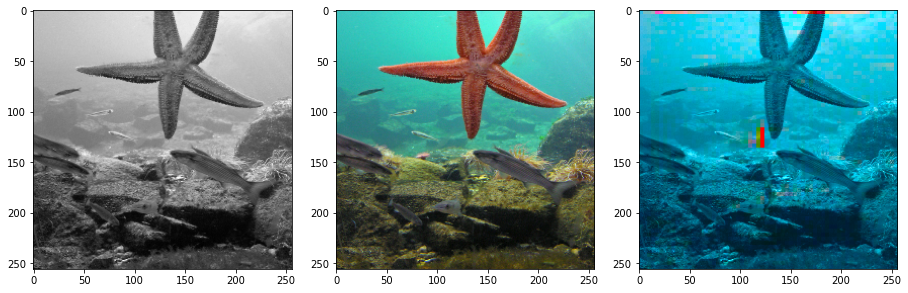

...

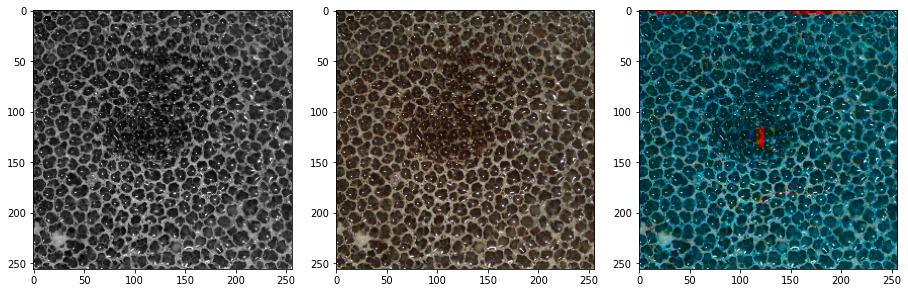

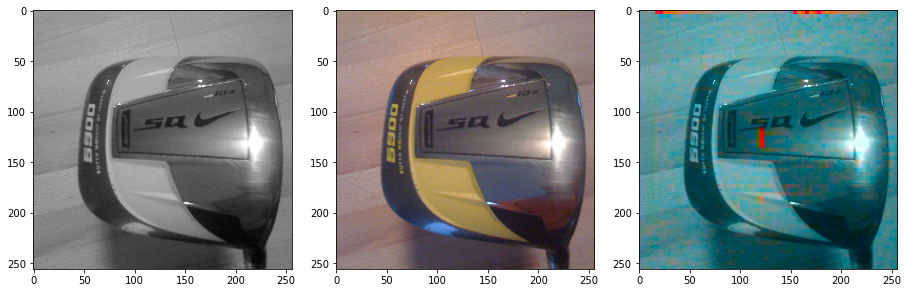

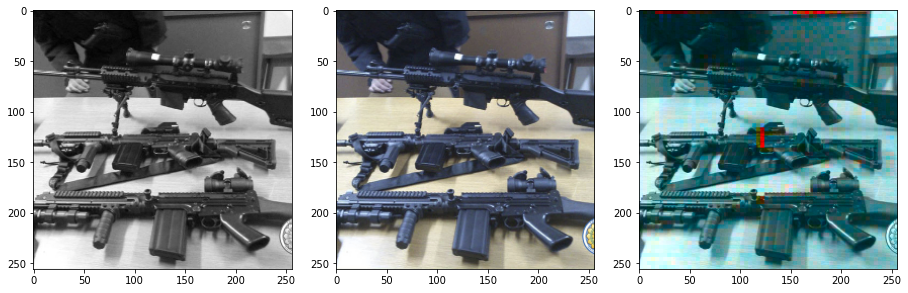

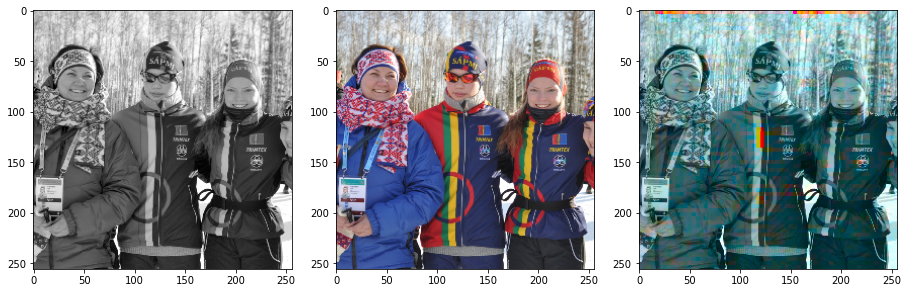

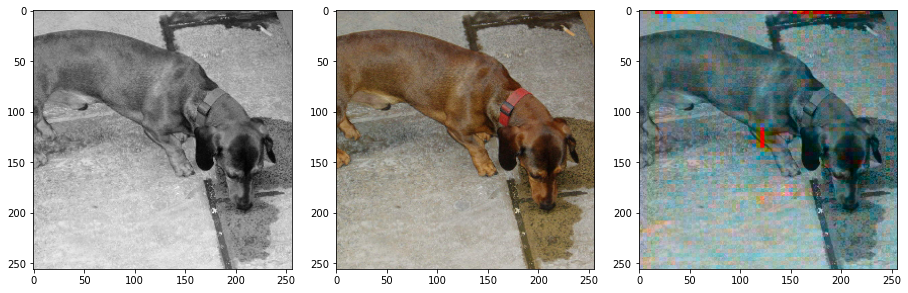

In [ ]:
fit(train_input, train_real, EPOCHS, test_input, test_real)

In [ ]:
generator_save_path= generator_path + str(len(os.listdir(generator_path))+1) + '.h5'
discriminator_save_path= discriminator_path + str(len(os.listdir(discriminator_path))+1) + '.h5'

generator.save(generator_save_path)
discriminator.save(discriminator_save_path)

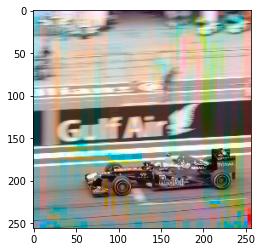

In [ ]:
im= generator(test_input[0][tf.newaxis,...])
im= cv2.cvtColor(cv2.merge((np.uint8(test_input[0]*256), np.uint8(im[0,:,:,0]*256), np.uint8(im[0,:,:,1]*256))), cv2.COLOR_LAB2RGB)
plt.imshow(im)